## $$\color{red}{\text{Nima Modirkiasaraee - Q2 (Interpretability of images)}}$$
## $$\color{red}{\text{810102339}}$$


### Import necessary libraries 

In [2]:
import torch
import torch.nn as nn
from torch.utils import data
from torchvision.models import vgg16, vgg19
from torchvision import transforms
from torchvision import datasets
import numpy as np
from PIL import Image
from torch.nn.functional import relu
import cv2
import matplotlib.pyplot as plt
from torch.autograd import Variable
from cleverhans.torch.attacks.fast_gradient_method import fast_gradient_method
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

## Gradient based pixel attribution

In [3]:
# Load the pretrained VGG16 model
model = vgg16(pretrained = True)
# model.load_state_dict(torch.load('vgg16-397923af.pth'))
model.eval()  # Set the model to evaluation mode
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

### GRAD-CAM

In [12]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.forward_output = None

    def save_gradient(self, grad):
        self.gradients = grad

    def forward_hook(self, module, input, output):
        self.forward_output = output
        output.register_hook(self.save_gradient)

    def generate_cam(self, input_image, target_class):
        # Register hook
        layer = self.model.features[self.target_layer]
        layer.register_forward_hook(self.forward_hook)

        # Forward pass
        output = self.model(input_image)
        if isinstance(target_class, int):
            target = output[0][target_class]
        else:
            target = output[0].max(0)[1]

        # Backward pass
        self.model.zero_grad()
        target.backward()

        # Generate CAM
        gradients = self.gradients.data[0]
        activation = self.forward_output.data[0]
        weights = torch.mean(gradients, dim=(1, 2), keepdim=True)
        cam = weights * activation
        cam = torch.sum(cam, dim=0)
        cam = relu(cam)
        cam = cam - cam.min()
        cam = cam / cam.max()

        return cam.cpu().numpy()

grad_cam = GradCAM(model, target_layer=29) 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


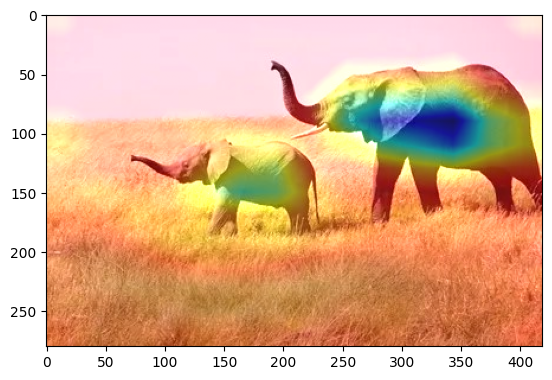

In [132]:
image_path = 'data/elephant.jpg'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 386
cam = grad_cam.generate_cam(input_img, target_class)
img = np.array(img)
heatmap = cv2.resize(cam, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.5 + img
plt.imshow(superimposed_img/255)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


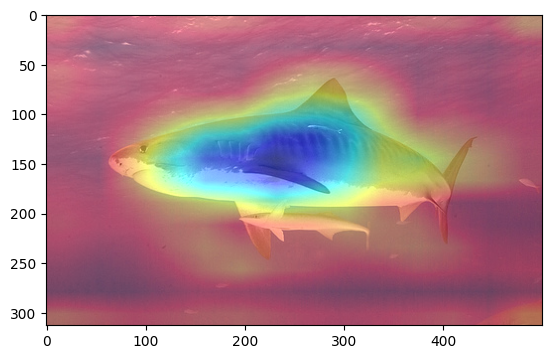

In [133]:
image_path = 'data/tiger_shark.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 3
cam = grad_cam.generate_cam(input_img, target_class)
img = np.array(img)
heatmap = cv2.resize(cam, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.5 + img
plt.imshow(superimposed_img/255)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


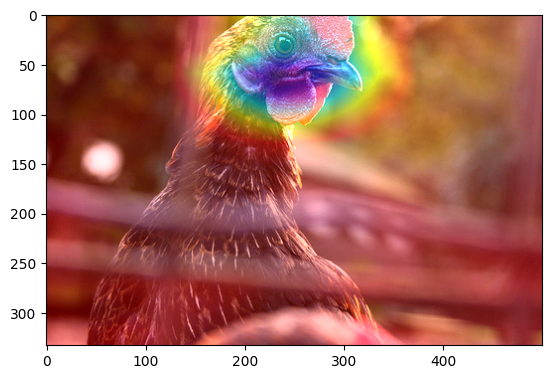

In [134]:
image_path = 'data/hen.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 8
cam = grad_cam.generate_cam(input_img, target_class)
img = np.array(img)
heatmap = cv2.resize(cam, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.5 + img
plt.imshow(superimposed_img/255)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


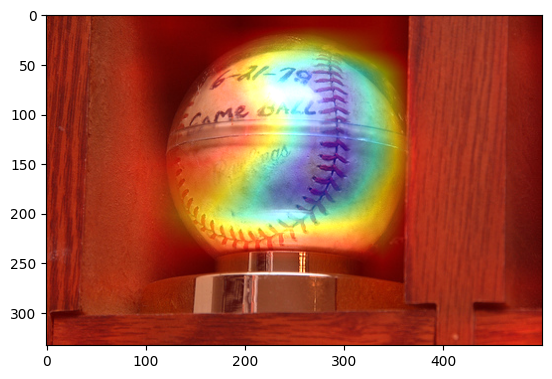

In [135]:
image_path = 'data/baseball.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 429
cam = grad_cam.generate_cam(input_img, target_class)
img = np.array(img)
heatmap = cv2.resize(cam, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.5 + img
plt.imshow(superimposed_img/255)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


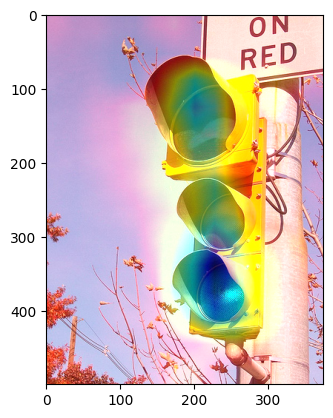

In [136]:
image_path = 'data/traffic_light.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 920
cam = grad_cam.generate_cam(input_img, target_class)
img = np.array(img)
heatmap = cv2.resize(cam, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.5 + img
plt.imshow(superimposed_img/255)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


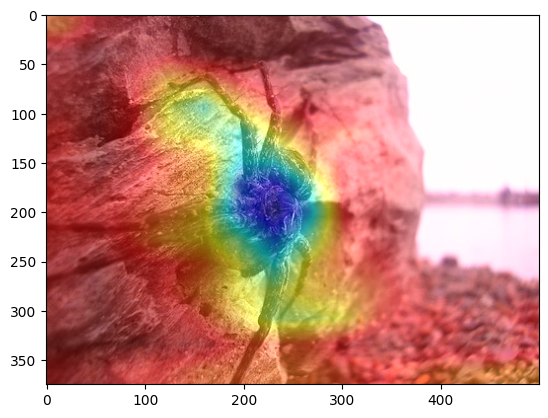

In [137]:
image_path = 'data/wolf_spider.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 77
cam = grad_cam.generate_cam(input_img, target_class)
img = np.array(img)
heatmap = cv2.resize(cam, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.5 + img
plt.imshow(superimposed_img/255)

### Guided Backpropagation

In [3]:
class Guided_backprop():
    def __init__(self, model):
        self.model = model
        self.image_reconstruction = None 
        self.activation_maps = []   
        self.model.eval()
        self.register_hooks()

    def register_hooks(self):
        def first_layer_hook_fn(module, grad_in, grad_out):
            self.image_reconstruction = grad_in[0] 

        def forward_hook_fn(module, input, output):
            self.activation_maps.append(output)

        def backward_hook_fn(module, grad_in, grad_out):
            grad = self.activation_maps.pop() 
            grad[grad > 0] = 1 
            positive_grad_out = torch.clamp(grad_out[0], min=0.0)
            new_grad_in = positive_grad_out * grad

            return (new_grad_in,)


        modules = list(self.model.features.named_children())

        # travese the modules，register forward hook & backward hook
        # for the ReLU
        for name, module in modules:
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(forward_hook_fn)
                module.register_backward_hook(backward_hook_fn)

        # register backward hook for the first conv layer
        first_layer = modules[0][1] 
        first_layer.register_backward_hook(first_layer_hook_fn)

    def visualize(self, input_image, target_class):
        model_output = self.model(input_image)
        self.model.zero_grad()
        pred_class = model_output.argmax().item()
        
        grad_target_map = torch.zeros(model_output.shape,
                                      dtype=torch.float)
        if target_class is not None:
            grad_target_map[0][target_class] = 1
        else:
            grad_target_map[0][pred_class] = 1
        
        model_output.backward(grad_target_map)
        
        result = self.image_reconstruction.data[0].permute(1,2,0)
        return result.numpy()

def normalize(image):
    norm = (image - image.mean())/image.std()
    norm = norm * 0.1
    norm = norm + 0.5
    norm = norm.clip(0, 1)
    return norm

guided_bp = Guided_backprop(model)

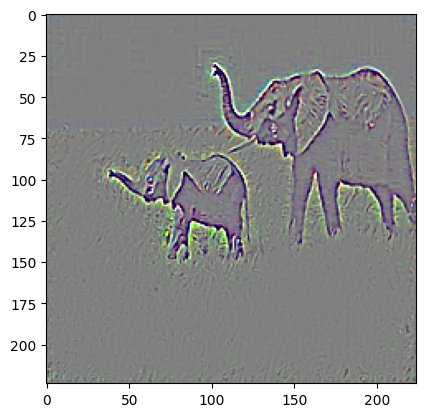

In [12]:
image = Image.open('data/elephant.jpg')
tensor = preprocess(image).unsqueeze(0).requires_grad_()
result = guided_bp.visualize(tensor, 386)
result = normalize(result)
plt.imshow(result)
plt.show()

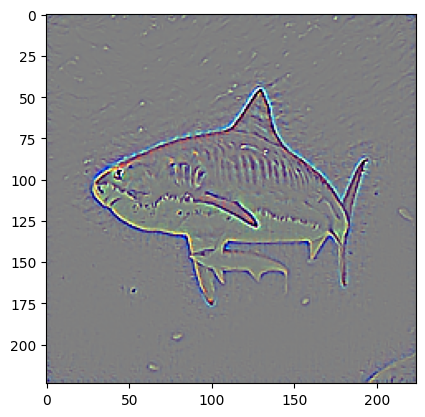

In [16]:
image = Image.open('data/tiger_shark.JPEG')
tensor = preprocess(image).unsqueeze(0).requires_grad_()
result = guided_bp.visualize(tensor, 3)
result = normalize(result)
plt.imshow(result)
plt.show()

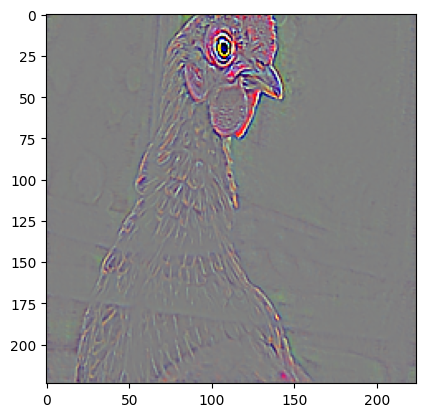

In [18]:
image = Image.open('data/hen.JPEG')
tensor = preprocess(image).unsqueeze(0).requires_grad_()
result = guided_bp.visualize(tensor, 8)
result = normalize(result)
plt.imshow(result)
plt.show()

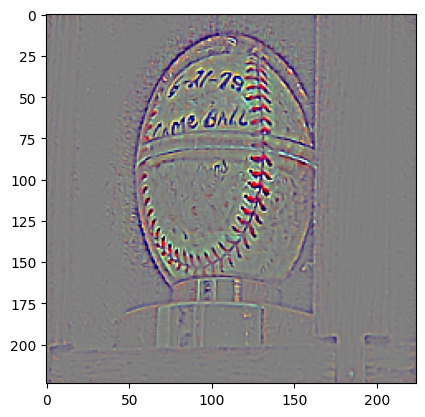

In [19]:
image = Image.open('data/baseball.JPEG')
tensor = preprocess(image).unsqueeze(0).requires_grad_()
result = guided_bp.visualize(tensor, 429)
result = normalize(result)
plt.imshow(result)
plt.show()

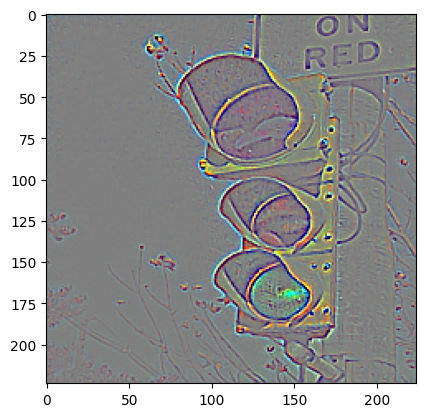

In [21]:
image = Image.open('data/traffic_light.JPEG')
tensor = preprocess(image).unsqueeze(0).requires_grad_()
result = guided_bp.visualize(tensor, 920)
result = normalize(result)
plt.imshow(result)
plt.show()

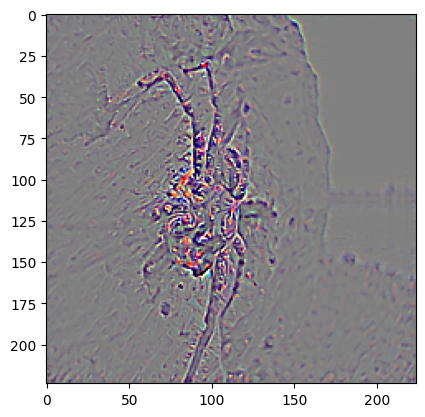

In [22]:
image = Image.open('data/wolf_spider.JPEG')
tensor = preprocess(image).unsqueeze(0).requires_grad_()
result = guided_bp.visualize(tensor, 77)
result = normalize(result)
plt.imshow(result)
plt.show()

### Guided GRAD-CAM

In [9]:
def guided_grad_cam(gradcam_heatmap, guided_backprop_gradients):
    # Resize Grad-CAM heatmap to match the size of the gradients
    gradcam_heatmap_resized = cv2.resize(gradcam_heatmap, guided_backprop_gradients.shape[:2])
    # Convert the 2D heatmap to 3D by repeating it across the color channels
    gradcam_heatmap_resized = np.repeat(gradcam_heatmap_resized[:, :, np.newaxis], 3, axis=2)
    # Element-wise multiplication
    guided_grad_cam_output = np.multiply(gradcam_heatmap_resized, guided_backprop_gradients)
    # Normalize the result to make it suitable for visualization
    guided_grad_cam_output = np.maximum(guided_grad_cam_output, 0)  # ReLU to ensure non-negative
    guided_grad_cam_output /= np.max(guided_grad_cam_output) if np.max(guided_grad_cam_output) > 0 else 1  # Avoid division by zero
    return guided_grad_cam_output

e:\Anaconda3\envs\tf\lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


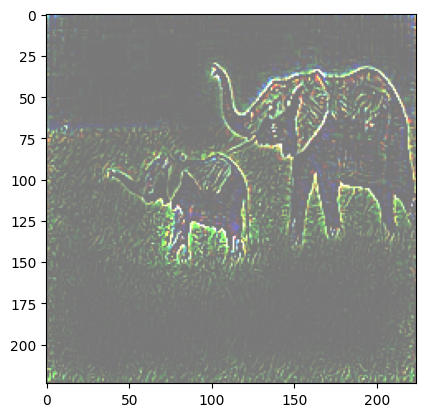

In [16]:
image_path = 'data/elephant.jpg'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 386
grad_cam = GradCAM(model, target_layer=29) 
cam = grad_cam.generate_cam(input_img, target_class)
guided_bp = Guided_backprop(model)
tensor = preprocess(img).unsqueeze(0).requires_grad_()
result = guided_bp.visualize(tensor, target_class)
guided_grad_cam_result = guided_grad_cam(cam, result)
plt.imshow(normalize(guided_grad_cam_result))
plt.show()

e:\Anaconda3\envs\tf\lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


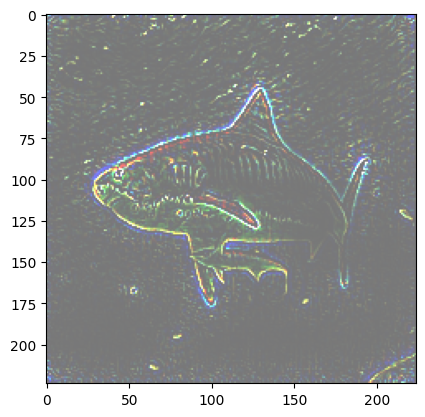

In [17]:
image_path = 'data/tiger_shark.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 3
grad_cam = GradCAM(model, target_layer=29) 
cam = grad_cam.generate_cam(input_img, target_class)
guided_bp = Guided_backprop(model)
tensor = preprocess(img).unsqueeze(0).requires_grad_()
result = guided_bp.visualize(tensor, target_class)
guided_grad_cam_result = guided_grad_cam(cam, result)
plt.imshow(normalize(guided_grad_cam_result))
plt.show()

e:\Anaconda3\envs\tf\lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


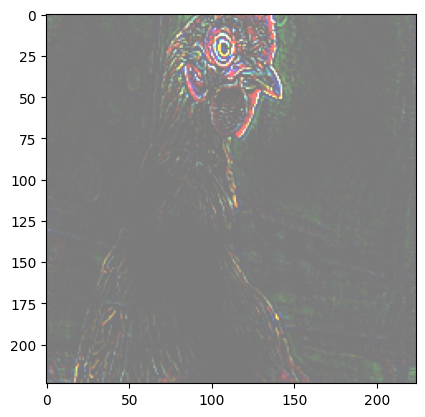

In [18]:
image_path = 'data/hen.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 8
grad_cam = GradCAM(model, target_layer=29) 
cam = grad_cam.generate_cam(input_img, target_class)
guided_bp = Guided_backprop(model)
tensor = preprocess(img).unsqueeze(0).requires_grad_()
result = guided_bp.visualize(tensor, target_class)
guided_grad_cam_result = guided_grad_cam(cam, result)
plt.imshow(normalize(guided_grad_cam_result))
plt.show()

e:\Anaconda3\envs\tf\lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


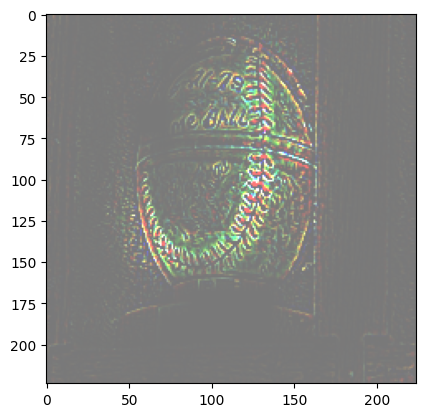

In [19]:
image_path = 'data/baseball.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 429
grad_cam = GradCAM(model, target_layer=29) 
cam = grad_cam.generate_cam(input_img, target_class)
guided_bp = Guided_backprop(model)
tensor = preprocess(img).unsqueeze(0).requires_grad_()
result = guided_bp.visualize(tensor, target_class)
guided_grad_cam_result = guided_grad_cam(cam, result)
plt.imshow(normalize(guided_grad_cam_result))
plt.show()

e:\Anaconda3\envs\tf\lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


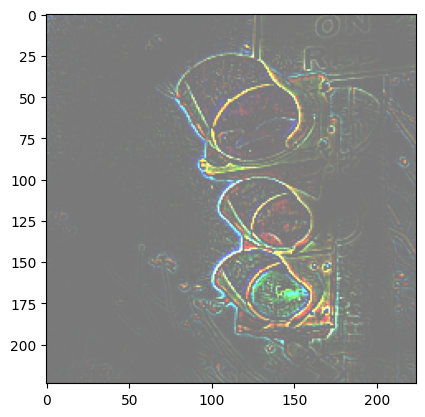

In [20]:
image_path = 'data/traffic_light.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 920
grad_cam = GradCAM(model, target_layer=29) 
cam = grad_cam.generate_cam(input_img, target_class)
guided_bp = Guided_backprop(model)
tensor = preprocess(img).unsqueeze(0).requires_grad_()
result = guided_bp.visualize(tensor, target_class)
guided_grad_cam_result = guided_grad_cam(cam, result)
plt.imshow(normalize(guided_grad_cam_result))
plt.show()

e:\Anaconda3\envs\tf\lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


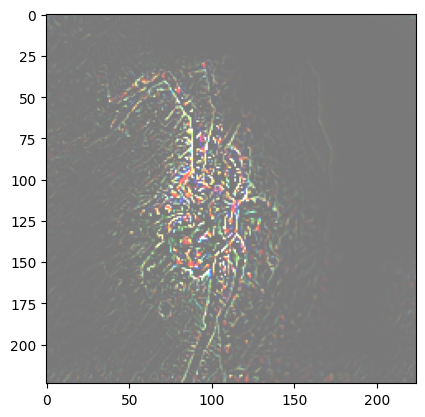

In [21]:
image_path = 'data/wolf_spider.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 77
grad_cam = GradCAM(model, target_layer=29) 
cam = grad_cam.generate_cam(input_img, target_class)
guided_bp = Guided_backprop(model)
tensor = preprocess(img).unsqueeze(0).requires_grad_()
result = guided_bp.visualize(tensor, target_class)
guided_grad_cam_result = guided_grad_cam(cam, result)
plt.imshow(normalize(guided_grad_cam_result))
plt.show()

### Guided backpropagation with smoothgrad

In [4]:
def generate_smooth_grad(guided_bp, tensor, target_class, param_n, param_sigma_multiplier):
    # Generate an empty image/matrix
    smooth_grad = np.zeros(tensor.size()[1:]).transpose(1, 2, 0)
    mean = 0
    sigma = param_sigma_multiplier / (torch.max(tensor) - torch.min(tensor)).item()
    for x in range(param_n):
        # Generate noise
        noise = Variable(tensor.data.new(tensor.size()).normal_(mean, sigma**2))
        # Add noise to the image
        noisy_img = tensor + noise
        # Calculate gradients
        vanilla_grads = guided_bp.visualize(noisy_img, target_class)
        # Add gradients to smooth_grad
        smooth_grad = smooth_grad + vanilla_grads
    # Average it out
    smooth_grad = smooth_grad / param_n
    return smooth_grad

e:\Anaconda3\envs\tf\lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


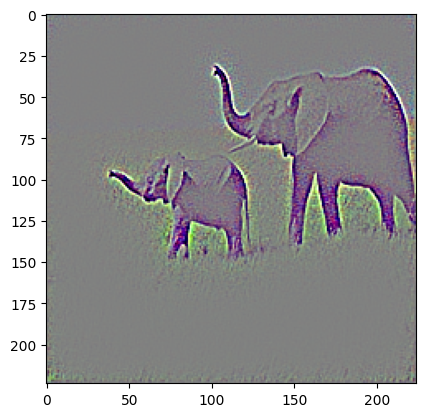

In [63]:
image = Image.open('data/elephant.jpg')
tensor = preprocess(image).unsqueeze(0).requires_grad_(True)
result = generate_smooth_grad(guided_bp, tensor, 386, 50, 4)
result = normalize(result)
plt.imshow(result)
plt.show()

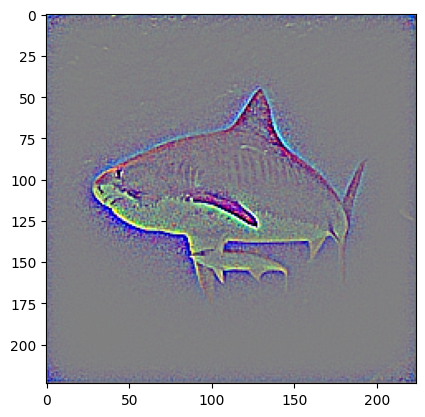

In [8]:
image = Image.open('data/tiger_shark.JPEG')
tensor = preprocess(image).unsqueeze(0).requires_grad_()
result = generate_smooth_grad(guided_bp, tensor, 3, 50, 2)
result = normalize(result)
plt.imshow(result)
plt.show()

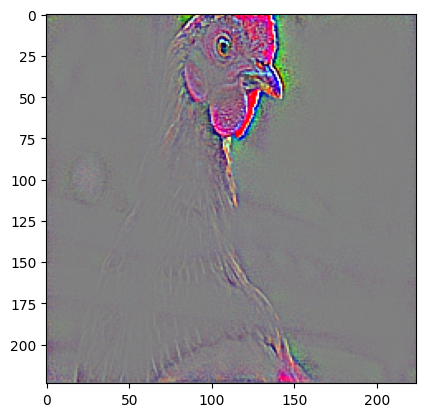

In [65]:
image = Image.open('data/hen.JPEG')
tensor = preprocess(image).unsqueeze(0).requires_grad_()
result = generate_smooth_grad(guided_bp, tensor, 8, 50, 4)
result = normalize(result)
plt.imshow(result)
plt.show()

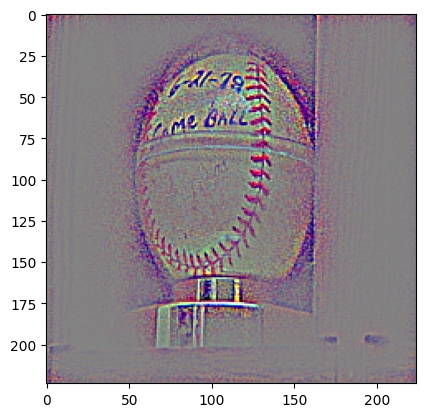

In [66]:
image = Image.open('data/baseball.JPEG')
tensor = preprocess(image).unsqueeze(0).requires_grad_()
result = generate_smooth_grad(guided_bp, tensor, 429, 50, 4)
result = normalize(result)
plt.imshow(result)
plt.show()

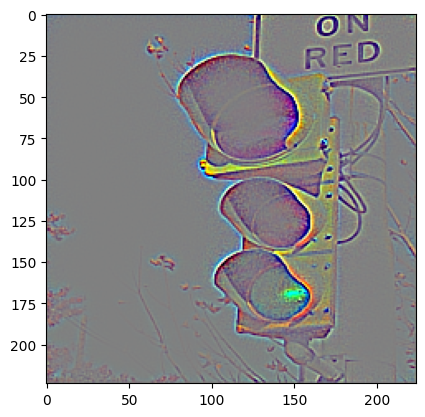

In [67]:
image = Image.open('data/traffic_light.JPEG')
tensor = preprocess(image).unsqueeze(0).requires_grad_()
result = generate_smooth_grad(guided_bp, tensor, 920, 50, 4)
result = normalize(result)
plt.imshow(result)
plt.show()

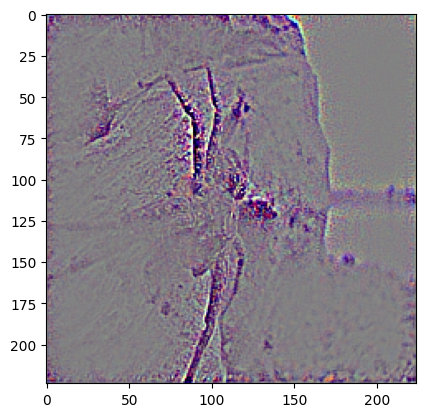

In [68]:
image = Image.open('data/wolf_spider.JPEG')
tensor = preprocess(image).unsqueeze(0).requires_grad_()
result = generate_smooth_grad(guided_bp, tensor, 77, 50, 4)
result = normalize(result)
plt.imshow(result)
plt.show()

### Guided GRAD-CAM with smooth grad

In [10]:
def guided_grad_cam(gradcam_heatmap, guided_backprop_gradients):
    # Resize Grad-CAM heatmap to match the size of the gradients
    gradcam_heatmap_resized = cv2.resize(gradcam_heatmap, guided_backprop_gradients.shape[:2])
    # Convert the 2D heatmap to 3D by repeating it across the color channels
    gradcam_heatmap_resized = np.repeat(gradcam_heatmap_resized[:, :, np.newaxis], 3, axis=2)
    # Element-wise multiplication
    guided_grad_cam_output = np.multiply(gradcam_heatmap_resized, guided_backprop_gradients)
    # Normalize the result to make it suitable for visualization
    guided_grad_cam_output = np.maximum(guided_grad_cam_output, 0)  # ReLU to ensure non-negative
    guided_grad_cam_output /= np.max(guided_grad_cam_output) if np.max(guided_grad_cam_output) > 0 else 1  # Avoid division by zero
    return guided_grad_cam_output

e:\Anaconda3\envs\tf\lib\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


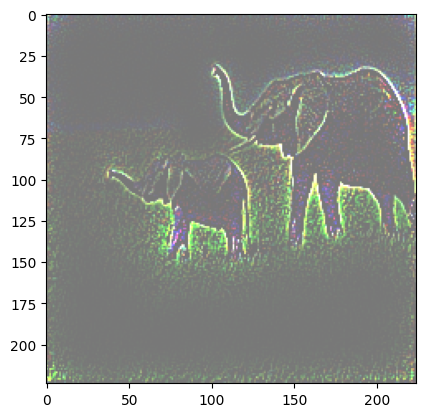

In [22]:
image_path = 'data/elephant.jpg'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 386
grad_cam = GradCAM(model, target_layer=29) 
cam = grad_cam.generate_cam(input_img, target_class)
guided_bp = Guided_backprop(model)
tensor = preprocess(img).unsqueeze(0).requires_grad_()
result = generate_smooth_grad(guided_bp, tensor, target_class, 50, 4)
guided_grad_cam_result = guided_grad_cam(cam, result)
plt.imshow(normalize(guided_grad_cam_result))
plt.show()

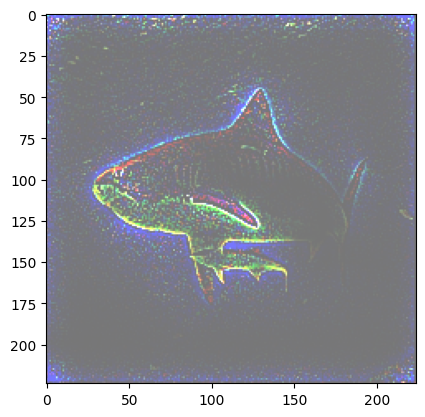

In [23]:
image_path = 'data/tiger_shark.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 3
grad_cam = GradCAM(model, target_layer=29) 
cam = grad_cam.generate_cam(input_img, target_class)
guided_bp = Guided_backprop(model)
tensor = preprocess(img).unsqueeze(0).requires_grad_()
result = generate_smooth_grad(guided_bp, tensor, target_class, 50, 2)
guided_grad_cam_result = guided_grad_cam(cam, result)
plt.imshow(normalize(guided_grad_cam_result))
plt.show()

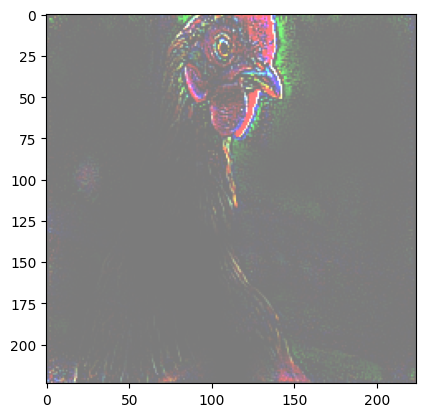

In [24]:
image_path = 'data/hen.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 8
grad_cam = GradCAM(model, target_layer=29) 
cam = grad_cam.generate_cam(input_img, target_class)
guided_bp = Guided_backprop(model)
tensor = preprocess(img).unsqueeze(0).requires_grad_()
result = generate_smooth_grad(guided_bp, tensor, target_class, 50, 4)
guided_grad_cam_result = guided_grad_cam(cam, result)
plt.imshow(normalize(guided_grad_cam_result))
plt.show()

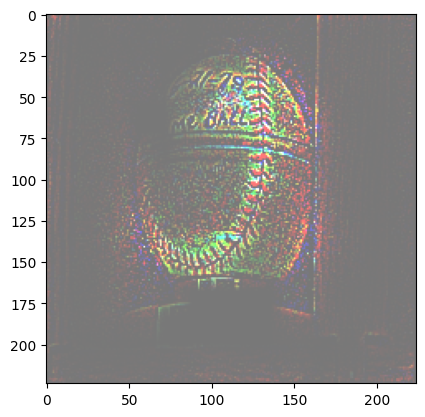

In [25]:
image_path = 'data/baseball.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 429
grad_cam = GradCAM(model, target_layer=29) 
cam = grad_cam.generate_cam(input_img, target_class)
guided_bp = Guided_backprop(model)
tensor = preprocess(img).unsqueeze(0).requires_grad_()
result = generate_smooth_grad(guided_bp, tensor, target_class, 50, 4)
guided_grad_cam_result = guided_grad_cam(cam, result)
plt.imshow(normalize(guided_grad_cam_result))
plt.show()

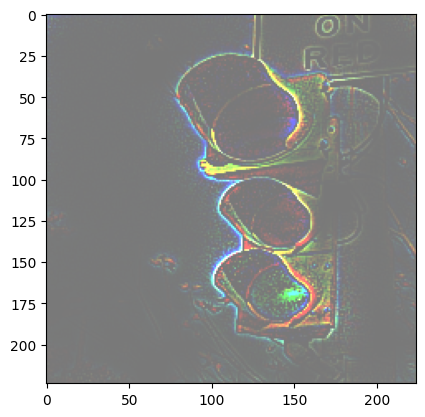

In [26]:
image_path = 'data/traffic_light.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 920
grad_cam = GradCAM(model, target_layer=29) 
cam = grad_cam.generate_cam(input_img, target_class)
guided_bp = Guided_backprop(model)
tensor = preprocess(img).unsqueeze(0).requires_grad_()
result = generate_smooth_grad(guided_bp, tensor, target_class, 50, 4)
guided_grad_cam_result = guided_grad_cam(cam, result)
plt.imshow(normalize(guided_grad_cam_result))
plt.show()

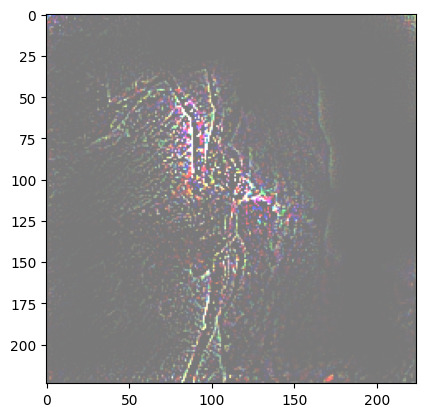

In [27]:
image_path = 'data/wolf_spider.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
target_class = 77
grad_cam = GradCAM(model, target_layer=29) 
cam = grad_cam.generate_cam(input_img, target_class)
guided_bp = Guided_backprop(model)
tensor = preprocess(img).unsqueeze(0).requires_grad_()
result = generate_smooth_grad(guided_bp, tensor, target_class, 50, 4)
guided_grad_cam_result = guided_grad_cam(cam, result)
plt.imshow(normalize(guided_grad_cam_result))
plt.show()

### ADVERSARIAL PERTURBATION AND PIXEL ATTRIBUTION

In [87]:
image_path = 'data/tiger_shark.JPEG'
img = Image.open(image_path)
input_img = preprocess(img).unsqueeze(0)
epsilon = 0.8
data_fgm = fast_gradient_method(model, input_img, epsilon, np.inf)

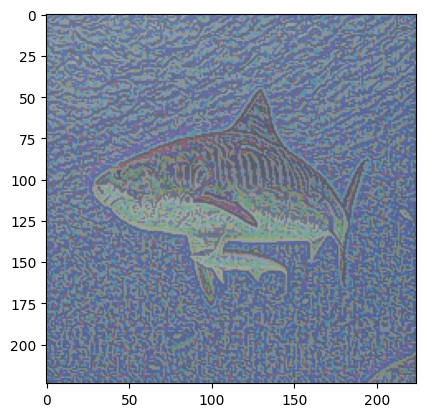

In [88]:
plt.imshow(np.transpose(normalize(data_fgm[0]).detach().numpy(), (1, 2, 0)))
plt.show()

In [89]:
output = model(data_fgm)
output.argmax().item()

65

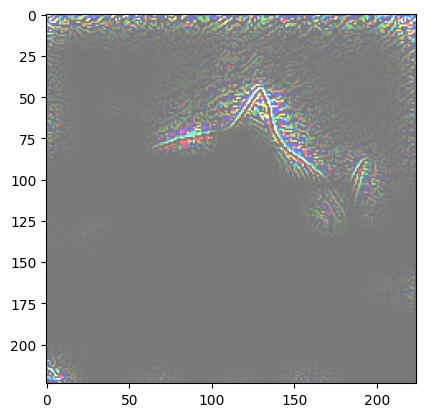

In [90]:
target_class = 3
grad_cam = GradCAM(model, target_layer=29) 
cam = grad_cam.generate_cam(data_fgm, target_class)
guided_bp = Guided_backprop(model)
tensor = data_fgm.requires_grad_()
result = generate_smooth_grad(guided_bp, tensor, target_class, 50, 4)
guided_grad_cam_result = guided_grad_cam(cam, result)
plt.imshow(normalize(guided_grad_cam_result))
plt.show()

## Feature visualization

In [5]:
# Load the pretrained VGG16 model
model = vgg16(pretrained = True)
# model.load_state_dict(torch.load('vgg16-397923af.pth'))
model.eval()  # Set the model to evaluation mode
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

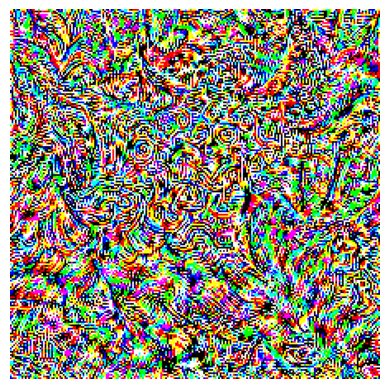

In [23]:
model = vgg16(pretrained = True)
# model.load_state_dict(torch.load('vgg16-397923af.pth'))
model.eval()  # Set the model to evaluation mode

# Class index for 'hen' in ImageNet
hen_idx = 8  

# Create an initial random image
image = torch.rand(1, 3, 224, 224, requires_grad=True)

# Optimizer
optimizer = torch.optim.Adam([image], lr=0.1)

# Optimization loop
for _ in range(200):  # Number of iterations
    optimizer.zero_grad()
    output = model(image)
    loss = -output[0, hen_idx]  # Negative logit for 'hen'
    loss.backward()
    optimizer.step()

image = image.detach().to('cpu').squeeze().permute(1, 2, 0)
image = torch.clamp(image, 0, 1)
plt.imshow(image)
plt.axis('off')
plt.show()

### Total variance regularization & Random shift

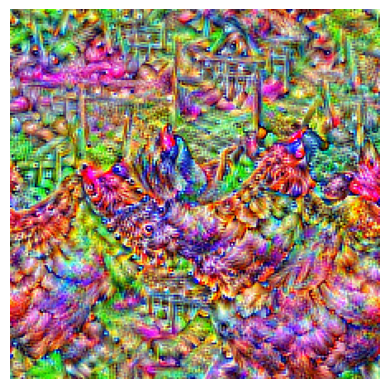

In [45]:
model = vgg16(pretrained = True)
# model.load_state_dict(torch.load('vgg16-397923af.pth'))
model.eval()  # Set the model to evaluation mode

hen_idx = 8  

# Create an initial random image
image = torch.rand(1, 3, 224, 224, requires_grad=True)

# Define optimizer
optimizer = torch.optim.Adam([image], lr=0.1)

# Define total variance loss
def total_variance_loss(img):
    w_variance = torch.sum(torch.pow(img[:,:,:,:-1] - img[:,:,:,1:], 2))
    h_variance = torch.sum(torch.pow(img[:,:,:-1,:] - img[:,:,1:,:], 2))
    return (w_variance + h_variance)

# Optimization loop
for i in range(300):
    # Random shift
    shifts = torch.randint(-10, 10, (2,))
    shifted_image = torch.roll(image, shifts=tuple(shifts), dims=(2, 3))
    
    optimizer.zero_grad()
    output = model(shifted_image)
    loss = -output[0, hen_idx]  # Maximize the hen logit
    loss += 0.01 * total_variance_loss(shifted_image)  # Regularization term
    loss.backward()
    optimizer.step()

    # Clamp the image to valid pixel range and reverse shift
    with torch.no_grad():
        image.data = torch.roll(image, shifts=tuple(-shifts), dims=(2, 3))
        image.data = image.clamp(0, 1)

image = image.detach().to('cpu').squeeze().permute(1, 2, 0)
image = torch.clamp(image, 0, 1)
plt.imshow(image)
plt.axis('off')
plt.show()

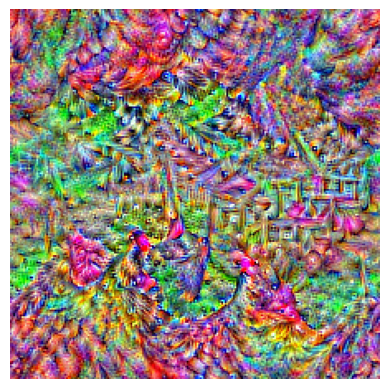

In [35]:
model = vgg16(pretrained = True)
# model.load_state_dict(torch.load('vgg16-397923af.pth'))
model.eval()  # Set the model to evaluation mode

hen_idx = 8  

# Create an initial random image
image = torch.rand(1, 3, 224, 224, requires_grad=True)

# Define optimizer
optimizer = torch.optim.Adam([image], lr=0.1)

# Define total variance loss
def total_variance_loss(img):
    w_variance = torch.sum(torch.pow(img[:,:,:,:-1] - img[:,:,:,1:], 2))
    h_variance = torch.sum(torch.pow(img[:,:,:-1,:] - img[:,:,1:,:], 2))
    return (w_variance + h_variance)

# Optimization loop
for i in range(200):
    # Random shift
    shifts = torch.randint(-10, 10, (2,))
    shifted_image = torch.roll(image, shifts=tuple(shifts), dims=(2, 3))
    
    optimizer.zero_grad()
    output = model(shifted_image)
    loss = -output[0, hen_idx]  # Maximize the hen logit
    loss += 0.01 * total_variance_loss(shifted_image)  # Regularization term
    loss.backward()
    optimizer.step()

    # Clamp the image to valid pixel range and reverse shift
    with torch.no_grad():
        image.data = torch.roll(image, shifts=tuple(-shifts), dims=(2, 3))
        image.data = image.clamp(0, 1)

image = image.detach().to('cpu').squeeze().permute(1, 2, 0)
image = torch.clamp(image, 0, 1)
plt.imshow(image)
plt.axis('off')
plt.show()

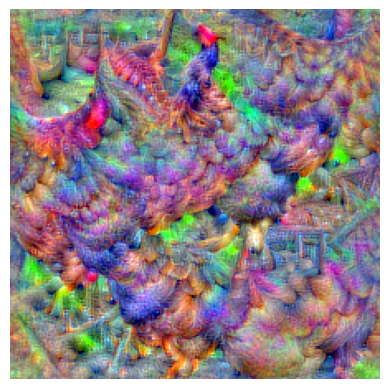

In [38]:
model = vgg16(pretrained = True)
# model.load_state_dict(torch.load('vgg16-397923af.pth'))
model.eval()  # Set the model to evaluation mode

hen_idx = 8  

# Create an initial random image
image = torch.rand(1, 3, 224, 224, requires_grad=True)

# Define optimizer
optimizer = torch.optim.Adam([image], lr=0.1)

# Define total variance loss
def total_variance_loss(img):
    w_variance = torch.sum(torch.pow(img[:,:,:,:-1] - img[:,:,:,1:], 2))
    h_variance = torch.sum(torch.pow(img[:,:,:-1,:] - img[:,:,1:,:], 2))
    return (w_variance + h_variance)

# Optimization loop
for i in range(200):
    # Random shift
    shifts = torch.randint(-10, 10, (2,))
    shifted_image = torch.roll(image, shifts=tuple(shifts), dims=(2, 3))
    
    optimizer.zero_grad()
    output = model(shifted_image)
    loss = -output[0, hen_idx]  # Maximize the hen logit
    loss += 0.1 * total_variance_loss(shifted_image)  # Regularization term
    loss.backward()
    optimizer.step()

    # Clamp the image to valid pixel range and reverse shift
    with torch.no_grad():
        image.data = torch.roll(image, shifts=tuple(-shifts), dims=(2, 3))
        image.data = image.clamp(0, 1)

image = image.detach().to('cpu').squeeze().permute(1, 2, 0)
image = torch.clamp(image, 0, 1)
plt.imshow(image)
plt.axis('off')
plt.show()

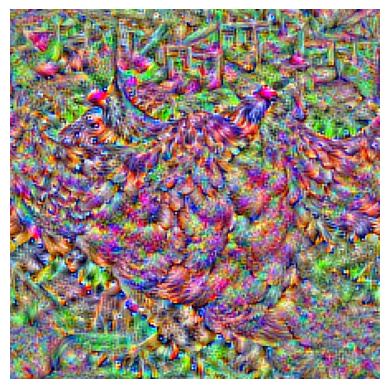

In [41]:
model = vgg16(pretrained = True)
# model.load_state_dict(torch.load('vgg16-397923af.pth'))
model.eval()  # Set the model to evaluation mode

hen_idx = 8  

# Create an initial random image
image = torch.rand(1, 3, 224, 224, requires_grad=True)

# Define optimizer
optimizer = torch.optim.Adam([image], lr=0.1)

# Define total variance loss
def total_variance_loss(img):
    w_variance = torch.sum(torch.pow(img[:,:,:,:-1] - img[:,:,:,1:], 2))
    h_variance = torch.sum(torch.pow(img[:,:,:-1,:] - img[:,:,1:,:], 2))
    return (w_variance + h_variance)

# Optimization loop
for i in range(200):
    # Random shift
    shifts = torch.randint(-30, 30, (2,))
    shifted_image = torch.roll(image, shifts=tuple(shifts), dims=(2, 3))
    
    optimizer.zero_grad()
    output = model(shifted_image)
    loss = -output[0, hen_idx]  # Maximize the hen logit
    loss += 0.01 * total_variance_loss(shifted_image)  # Regularization term
    loss.backward()
    optimizer.step()

    # Clamp the image to valid pixel range and reverse shift
    with torch.no_grad():
        image.data = torch.roll(image, shifts=tuple(-shifts), dims=(2, 3))
        image.data = image.clamp(0, 1)

image = image.detach().to('cpu').squeeze().permute(1, 2, 0)
image = torch.clamp(image, 0, 1)
plt.imshow(image)
plt.axis('off')
plt.show()

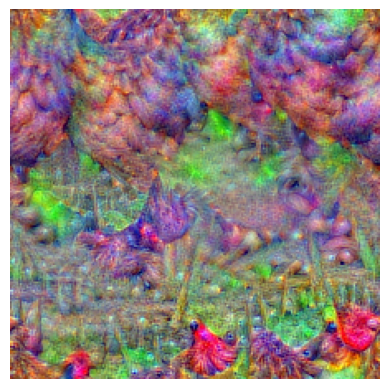

In [7]:
model = vgg16(pretrained = True)
# model.load_state_dict(torch.load('vgg16-397923af.pth'))
model.eval()  # Set the model to evaluation mode

hen_idx = 8  

# Create an initial random image
image = torch.rand(1, 3, 224, 224, requires_grad=True)

# Define optimizer
optimizer = torch.optim.Adam([image], lr=0.1)

# Define total variance loss
def total_variance_loss(img):
    w_variance = torch.sum(torch.pow(img[:,:,:,:-1] - img[:,:,:,1:], 2))
    h_variance = torch.sum(torch.pow(img[:,:,:-1,:] - img[:,:,1:,:], 2))
    return (w_variance + h_variance)

# Optimization loop
for i in range(500):
    # Random shift
    shifts = torch.randint(-10, 10, (2,))
    shifted_image = torch.roll(image, shifts=tuple(shifts), dims=(2, 3))
    
    optimizer.zero_grad()
    output = model(shifted_image)
    loss = -output[0, hen_idx]  # Maximize the hen logit
    loss += 0.1 * total_variance_loss(shifted_image)  # Regularization term
    loss.backward()
    optimizer.step()

    # Clamp the image to valid pixel range and reverse shift
    with torch.no_grad():
        image.data = torch.roll(image, shifts=tuple(-shifts), dims=(2, 3))
        image.data = image.clamp(0, 1)

image = image.detach().to('cpu').squeeze().permute(1, 2, 0)
image = torch.clamp(image, 0, 1)
plt.imshow(image)
plt.axis('off')
plt.show()

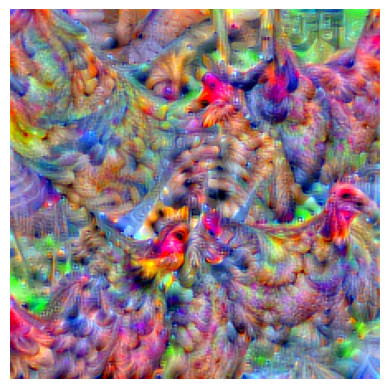

In [8]:
model = vgg16(pretrained = True)
# model.load_state_dict(torch.load('vgg16-397923af.pth'))
model.eval()  # Set the model to evaluation mode

hen_idx = 8  

# Create an initial random image
image = torch.rand(1, 3, 224, 224, requires_grad=True)

# Define optimizer
optimizer = torch.optim.Adam([image], lr=0.1)

# Define total variance loss
def total_variance_loss(img):
    w_variance = torch.sum(torch.pow(img[:,:,:,:-1] - img[:,:,:,1:], 2))
    h_variance = torch.sum(torch.pow(img[:,:,:-1,:] - img[:,:,1:,:], 2))
    return (w_variance + h_variance)

# Optimization loop
for i in range(200):
    # Random shift
    # shifts = torch.randint(-10, 10, (2,))
    # shifted_image = torch.roll(image, shifts=tuple(shifts), dims=(2, 3))
    
    optimizer.zero_grad()
    output = model(image)
    loss = -output[0, hen_idx]  # Maximize the hen logit
    loss += 0.1 * total_variance_loss(image)  # Regularization term
    loss.backward()
    optimizer.step()

    # # Clamp the image to valid pixel range and reverse shift
    # with torch.no_grad():
    #     image.data = torch.roll(image, shifts=tuple(-shifts), dims=(2, 3))
    #     image.data = image.clamp(0, 1)

image = image.detach().to('cpu').squeeze().permute(1, 2, 0)
image = torch.clamp(image, 0, 1)
plt.imshow(image)
plt.axis('off')
plt.show()